In [1]:
import pandas as pd
import yfinance as yf
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import panel as pn
import panel.widgets as pnw
from panel.interact import interact
pn.extension()
import plotly.express as px
pn.extension("plotly")
import hvplot.pandas


#Fetching the Cryptos from Yahoo Finance
stocks = ['BTC-USD','ETH-USD','LTC-USD','BCH-USD','XRP-USD']
start = datetime.datetime(2016,1,1)
end = datetime.datetime(2021,7,5)


#Defining the Dataframe
crypto_data = yf.download(tickers = stocks, start="2016-01-01", end="2021-07-05")
crypto_data.head()




[*********************100%***********************]  5 of 5 completed


Adj Close                                            Close  \
             BCH-USD     BTC-USD   ETH-USD  LTC-USD   XRP-USD BCH-USD   
Date                                                                    
2016-01-01       NaN  434.334015  0.948024  3.50898  0.005955     NaN   
2016-01-02       NaN  433.437988  0.937124  3.50216  0.006065     NaN   
2016-01-03       NaN  430.010986  0.971905  3.48307  0.006017     NaN   
2016-01-04       NaN  433.091003  0.954480  3.49539  0.005958     NaN   
2016-01-05       NaN  431.959991  0.950176  3.46967  0.006044     NaN   

                                                     ...    Open              \
               BTC-USD   ETH-USD  LTC-USD   XRP-USD  ... BCH-USD     BTC-USD   
Date                                                 ...                       
2016-01-01  434.334015  0.948024  3.50898  0.005955  ...     NaN  430.721008   
2016-01-02  433.437988  0.937124  3.50216  0.006065  ...     NaN  434.622009   
2016-01-03  430.010986  0.971905  3.48307  0.006017  ...     NaN  433.578003   
2016-01-04  433.091003  0.954480  3.49539  0.005958  ...     NaN  430.061005   
2016-01-05  431.959991  0.950176  3.46967  0.006044  ...     NaN  433.069000   

                                         Volume                             \
             ETH-USD  LTC-USD   XRP-USD BCH-USD   BTC-USD ETH-USD  LTC-USD   
Date                                                                         
2016-01-01  0.933712  3.47952  0.006040     NaN  36278900  206062  2791170   
2016-01-02  0.947401  3.51528  0.005957     NaN  30096600  255504  3020260   
2016-01-03  0.938430  3.50400  0.006066     NaN  39633800  407632  2406150   
2016-01-04  0.972045  3.47910  0.006019     NaN  38477500  346245  3309740   
2016-01-05  0.953147  3.49200  0.005954     NaN  34522600  219833  2104650   

                    
           XRP-USD  
Date                
2016-01-01  211767  
2016-01-02  278539  
2016-01-03  291723  
2016-01-04  310820  
2016-01-05  381554  

[5 rows x 30 columns]

In [2]:
#Data Cleaning
crypto_data=crypto_data.dropna()
crypto_data.isna().sum()



Adj Close  BCH-USD    0
           BTC-USD    0
           ETH-USD    0
           LTC-USD    0
           XRP-USD    0
Close      BCH-USD    0
           BTC-USD    0
           ETH-USD    0
           LTC-USD    0
           XRP-USD    0
High       BCH-USD    0
           BTC-USD    0
           ETH-USD    0
           LTC-USD    0
           XRP-USD    0
Low        BCH-USD    0
           BTC-USD    0
           ETH-USD    0
           LTC-USD    0
           XRP-USD    0
Open       BCH-USD    0
           BTC-USD    0
           ETH-USD    0
           LTC-USD    0
           XRP-USD    0
Volume     BCH-USD    0
           BTC-USD    0
           ETH-USD    0
           LTC-USD    0
           XRP-USD    0
dtype: int64

In [3]:
#Getting the closing prices
crypto_data=crypto_data['Close']


In [4]:
#Calculating the Daily Retunrns
crypto_daily_returns=crypto_data.pct_change()
crypto_daily_returns

,BCH-USD,BTC-USD,ETH-USD,LTC-USD,XRP-USD
Date,,,,,
2017-07-23,NaN,NaN,NaN,NaN,NaN
2017-07-24,0.066918,0.008958,-0.005488,0.007935,-0.015667
2017-07-25,-0.076705,-0.064751,-0.080107,-0.048737,-0.072385
2017-07-26,-0.100962,-0.018254,-0.013338,-0.000275,-0.024042
2017-07-27,0.053751,0.056269,0.001790,-0.002129,-0.002100
...,...,...,...,...,...
2021-07-01,-0.053396,-0.041914,-0.070758,-0.045501,-0.063980
2021-07-02,-0.003701,0.009679,0.017238,-0.004607,-0.006680
2021-07-03,0.018072,0.022760,0.035383,0.024360,0.024552


In [5]:
#Defining a function for Fibonacci Retracement 
import matplotlib.pyplot as plt
def plot_fib_ret(data,crypto_name):
    max_price = data[crypto_name].max()
    min_price = data[crypto_name].min()
    diff = max_price - min_price     
    Level1 = max_price - diff * 0.236   
    Level2 = max_price - diff * 0.382      
    Level3 = max_price - diff * 0.618  
    fibonacci = plt.figure(figsize=(20,5))
    plt.title('Fibonnacci Retracement')
    plt.plot(data.index, data[crypto_name])
    plt.axhline(max_price, alpha=1, color = 'red')
    plt.axhline(Level1,color = 'orange')
    plt.axhline(Level2,color = 'green')
    plt.axhline(Level3,color = 'blue')
    plt.axhline(min_price,color = 'black')
    plt.xlabel('Date',fontsize=15)
    plt.ylabel(f'Closing Price {crypto_name}',fontsize=15)


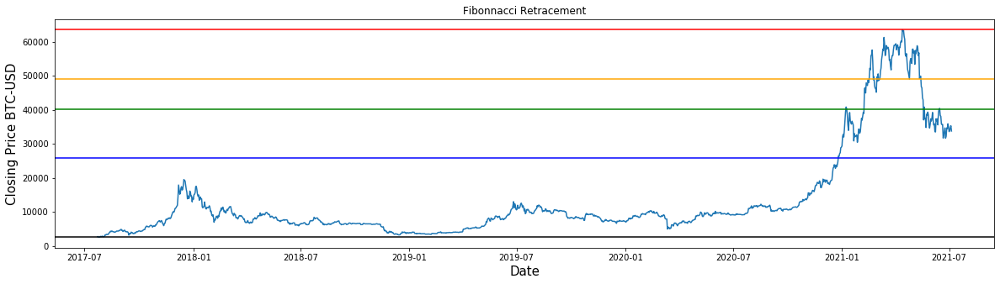

In [6]:
#Fibonnaci Retracement for Bitcoin
plot_fib_ret(crypto_data,'BTC-USD')

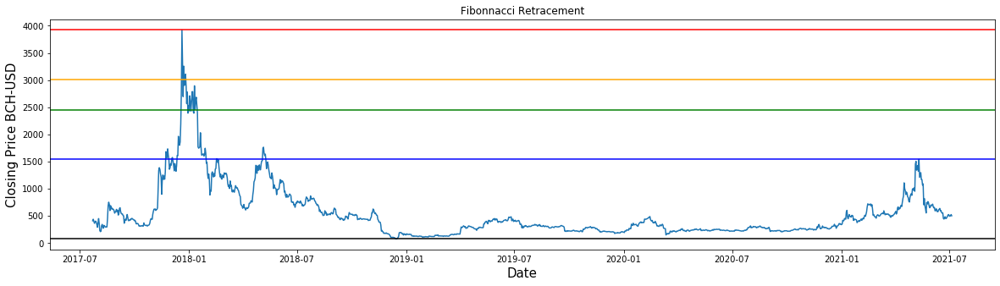

In [7]:
#Fibonnaci Retracement for Bitcash
plot_fib_ret(crypto_data,'BCH-USD')

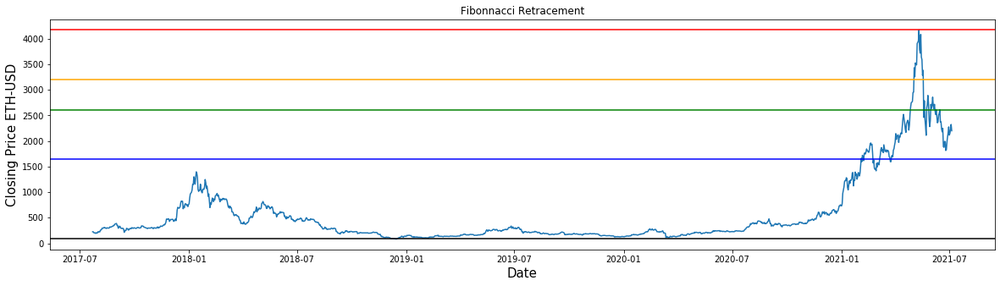

In [8]:
#Fibonnaci Retracement for Ethereum
plot_fib_ret(crypto_data,'ETH-USD')

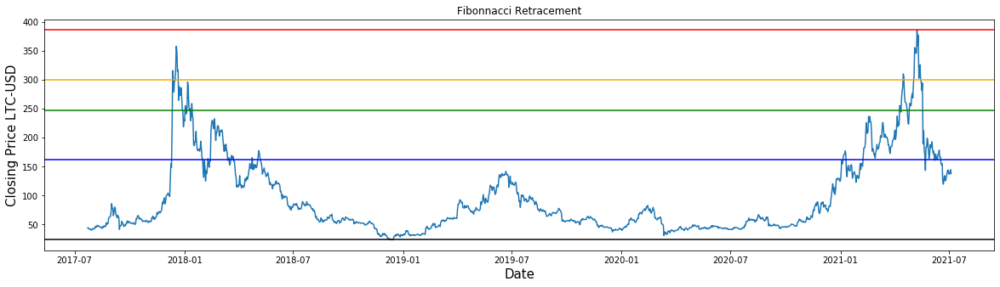

In [9]:
#Fibonnaci Retracement for Litecoin
plot_fib_ret(crypto_data,'LTC-USD')

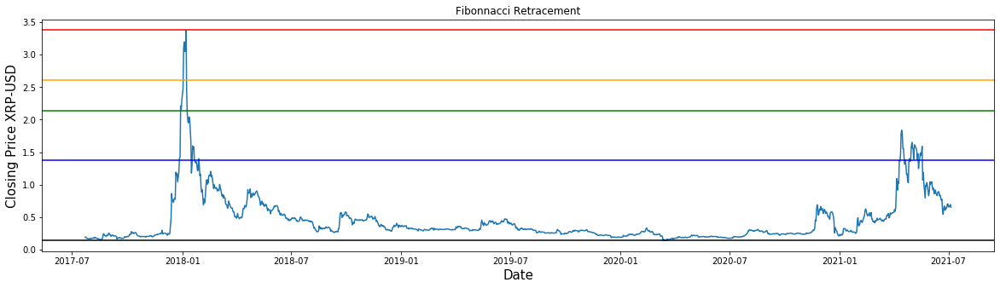

In [10]:
#Fibonnaci Retracement for Ripple
plot_fib_ret(crypto_data,'XRP-USD')

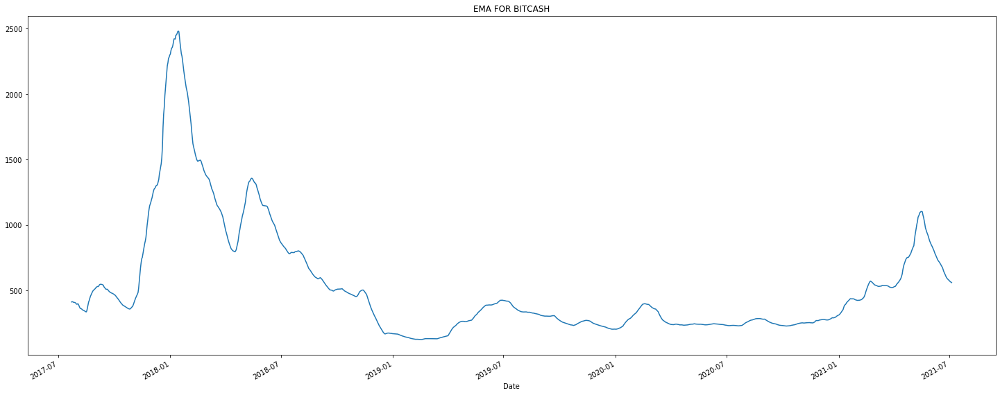

In [11]:
# Exponential 30 Day Moving Average Bitcash
bch_EMA= crypto_data['BCH-USD'].ewm(span=30, adjust=False).mean()
bch_EMA.plot(figsize=(25,10),title="EMA FOR BITCASH")

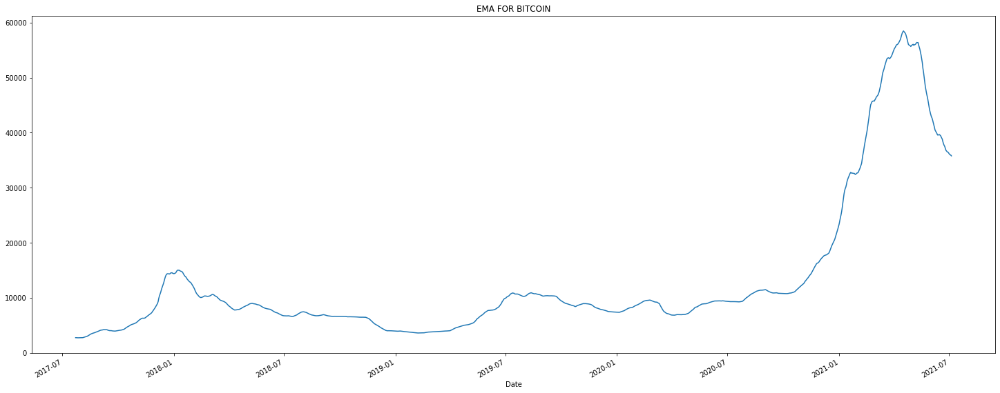

In [12]:
# Exponential 30 Day Moving Average Bitcoin
btc_EMA= crypto_data['BTC-USD'].ewm(span=30, adjust=False).mean()
btc_EMA.plot(figsize=(25,10),title="EMA FOR BITCOIN")

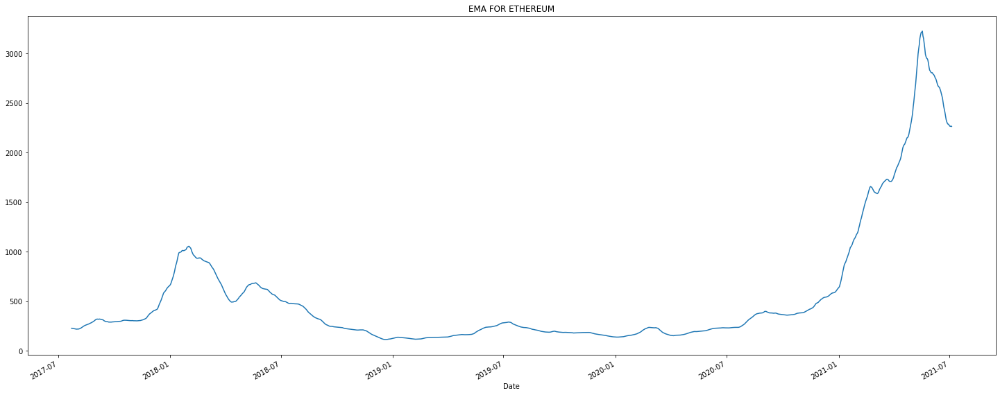

In [13]:
# Exponential 30 Day Moving Average Ethereum
eth_EMA= crypto_data['ETH-USD'].ewm(span=30, adjust=False).mean()
eth_EMA.plot(figsize=(25,10),title="EMA FOR ETHEREUM")

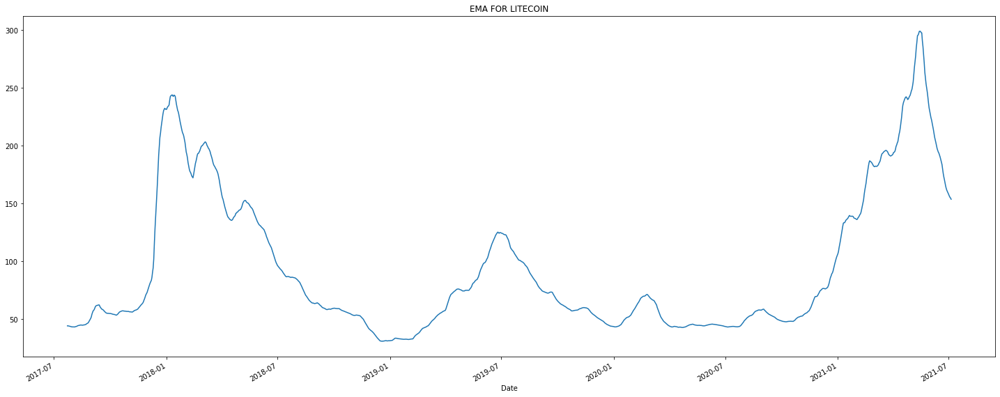

In [14]:
# Exponential 30 Day Moving Average Litecoin
ltc_EMA= crypto_data['LTC-USD'].ewm(span=30, adjust=False).mean()
ltc_EMA.plot(figsize=(25,10),title="EMA FOR LITECOIN")

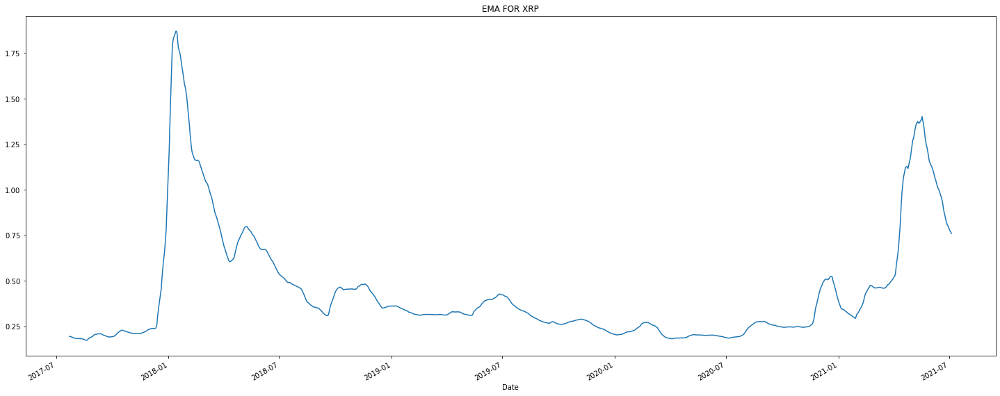

In [15]:
# Exponential 30 Day Moving Average Ripple
xrp_EMA= crypto_data['XRP-USD'].ewm(span=30, adjust=False).mean()
xrp_EMA.plot(figsize=(25,10),title="EMA FOR XRP")

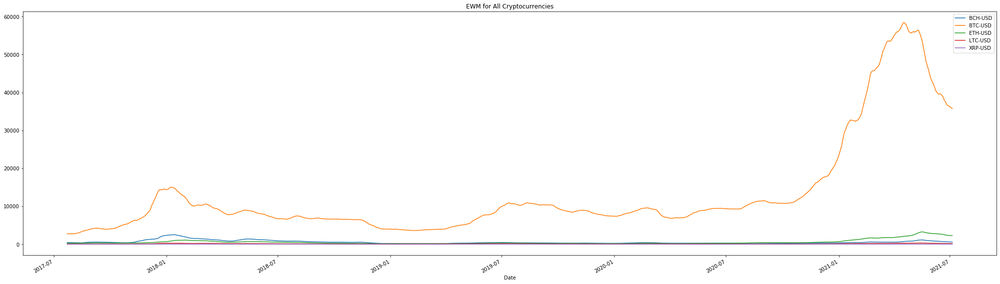

In [16]:
# Exponential Moving Average for closing prices (30 days)
Exponential_moving_avg = crypto_data.ewm(span=30, adjust=False).mean()
Exponential_moving_avg.plot(figsize=(35,10) , title = "EWM for All Cryptocurrencies") 

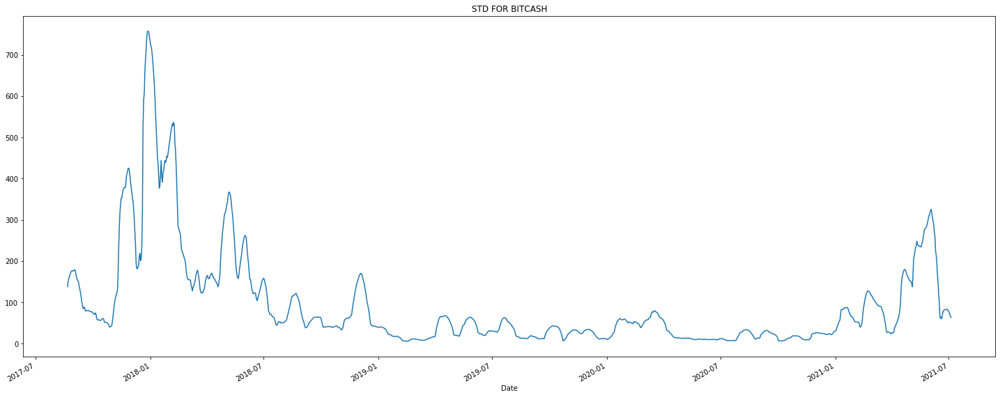

In [17]:
# Standard Deviation Bitcash 
bch_std= crypto_data['BCH-USD'].rolling(window=30).std()
bch_std.plot(figsize=(25,10),title='STD FOR BITCASH')

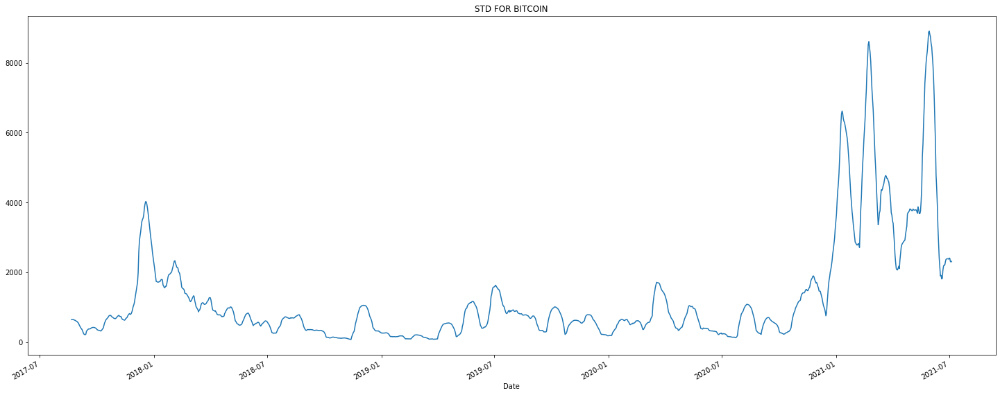

In [18]:
# Standard Deviation Bitcoin 
btc_std = crypto_data['BTC-USD'].rolling(window=30).std()
btc_std.plot(figsize=(25,10),title='STD FOR BITCOIN')

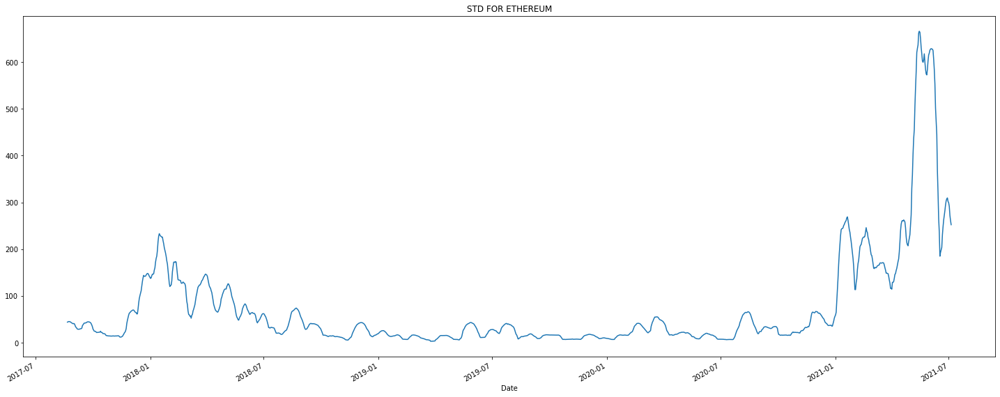

In [19]:
# Standard Deviation Ethereum
eth_std = crypto_data['ETH-USD'].rolling(window=30).std()
eth_std.plot(figsize=(25,10),title='STD FOR ETHEREUM')

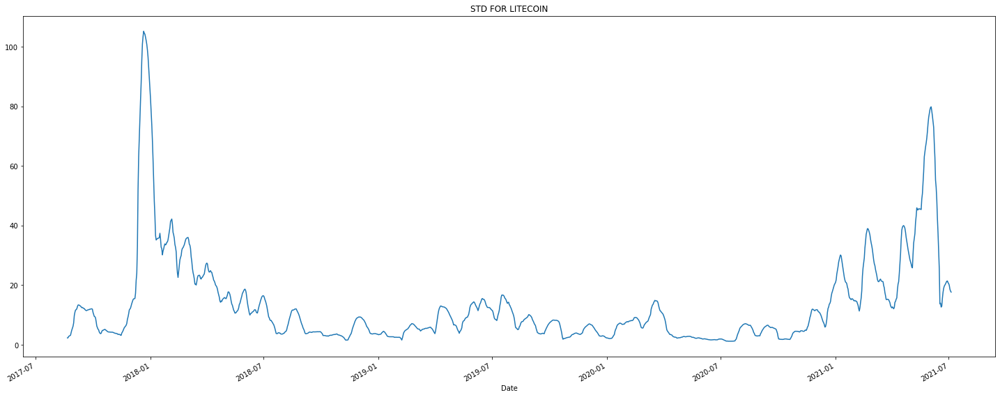

In [20]:
# Standard Deviation Litecoin
ltc_std = crypto_data['LTC-USD'].rolling(window=30).std()
ltc_std.plot(figsize=(25,10),title='STD FOR LITECOIN')

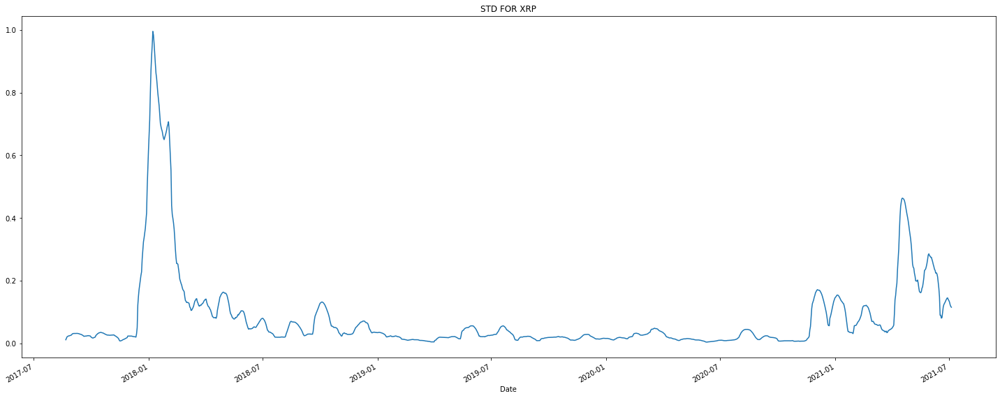

In [21]:
# Standard Deviation Ripple
xrp_std = crypto_data['XRP-USD'].rolling(window=30).std()
xrp_std.plot(figsize=(25,10),title='STD FOR XRP')

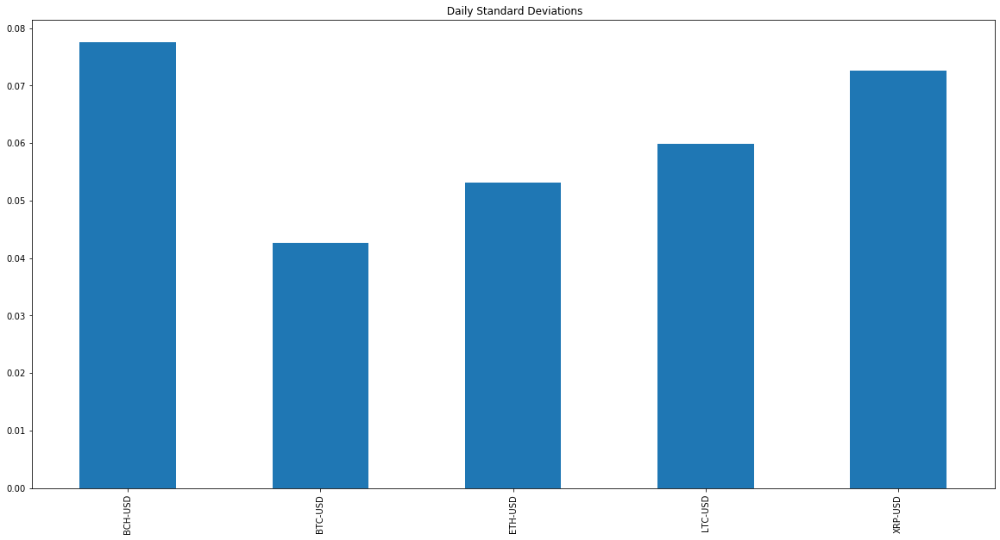

In [22]:
# Plot Standard Deviations
daily_std = crypto_daily_returns.std()
daily_std.plot(kind='bar',title=" Daily Standard Deviations",figsize=(20,10))

In [23]:
# Calculate the annualized standard deviation
annualized_std = daily_std *np.sqrt(252)
annualized_std.sort_values(ascending=False)

BCH-USD    1.231358
XRP-USD    1.152438
LTC-USD    0.951134
ETH-USD    0.842918
BTC-USD    0.676919
dtype: float64

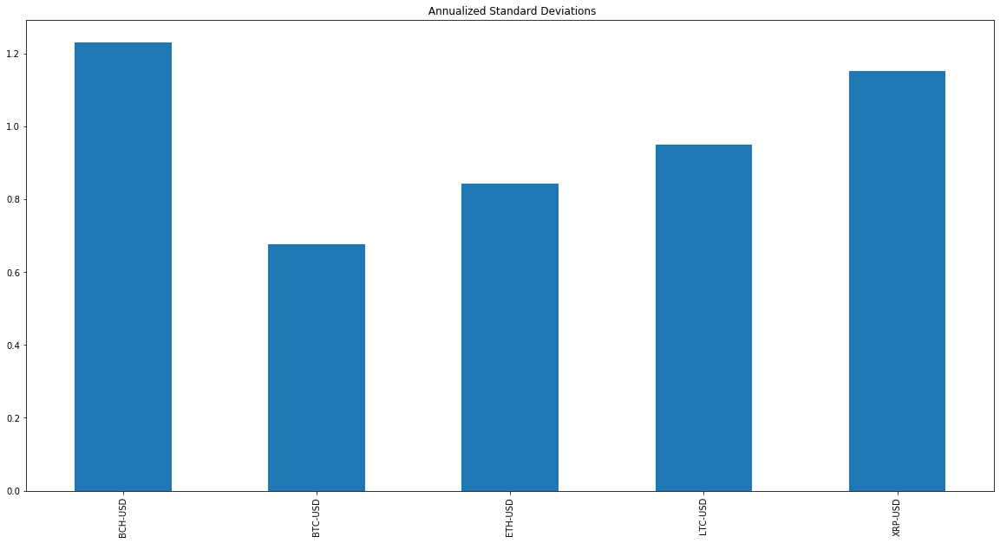

In [24]:
#Plot annualizaed STD
annualized_std.plot(kind='bar',title=" Annualized Standard Deviations",figsize=(20,10))

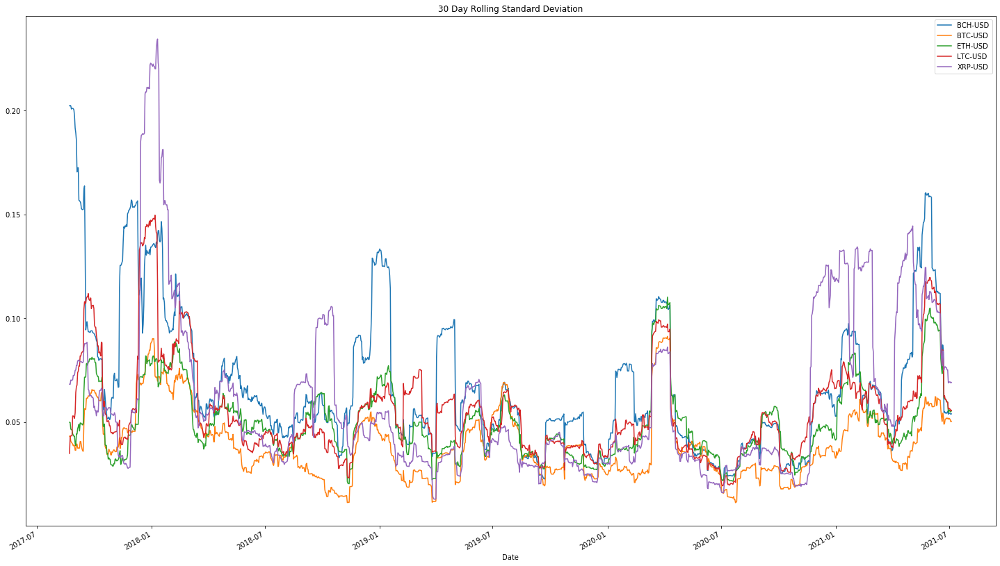

In [25]:
# Plot the rolling standard deviation for all returns using 30 day window
crypto_daily_returns.rolling(window=30).std().plot(title="30 Day Rolling Standard Deviation" , figsize=(25,15))

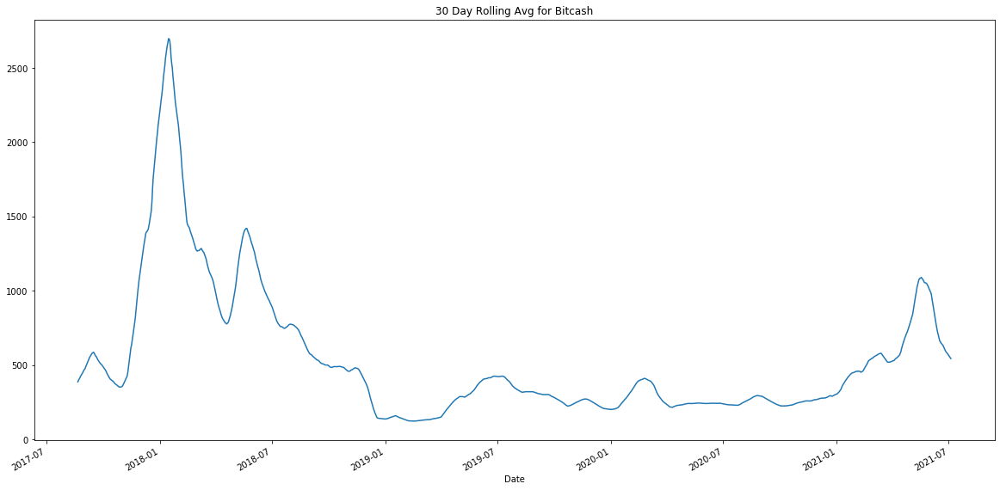

In [26]:
# 30 Day Rolling Average Bitcash
bch_sma = crypto_data['BCH-USD'].rolling(window=30).mean()
bch_sma.plot(figsize=(20,10),title='30 Day Rolling Avg for Bitcash')

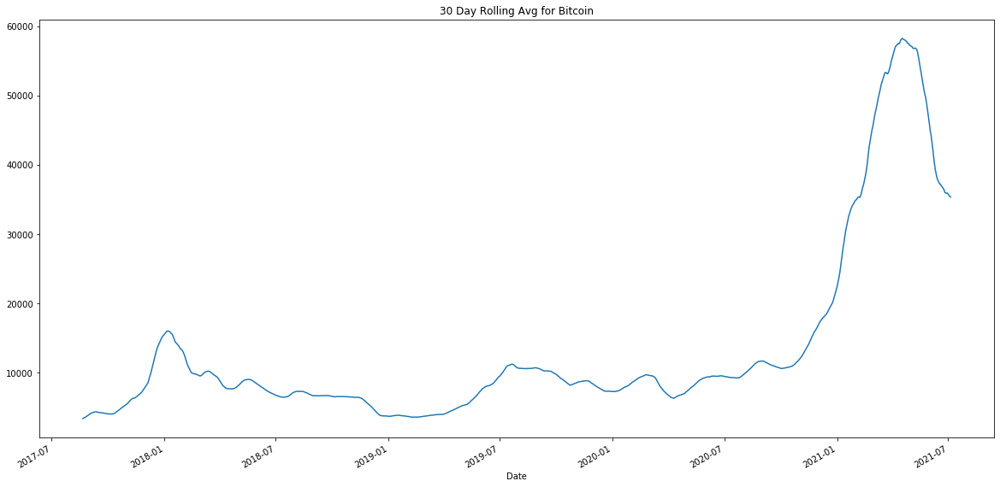

In [27]:
# 30 Day Rolling Average Bitcoin
btc_sma = crypto_data['BTC-USD'].rolling(window=30).mean()
btc_sma.plot(figsize=(20,10),title='30 Day Rolling Avg for Bitcoin')

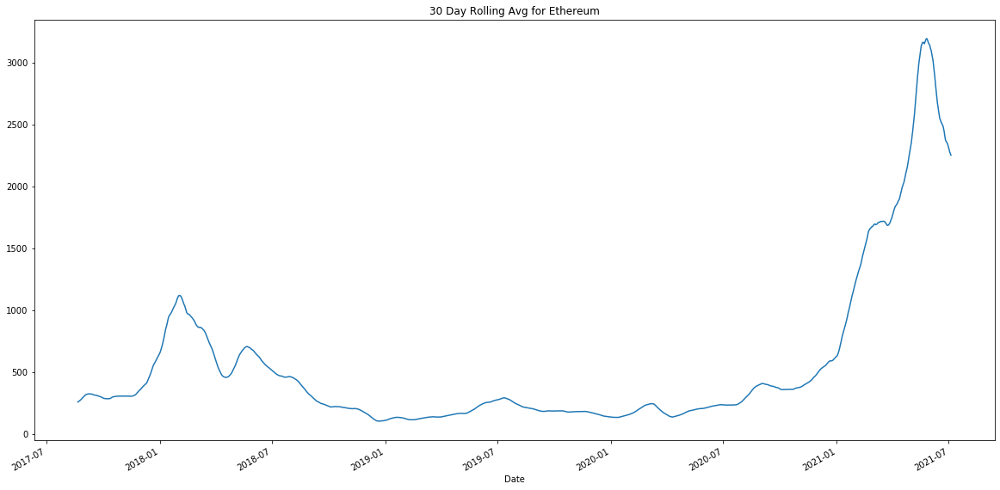

In [28]:
# 30 Day Rolling Average Ethereum
eth_sma = crypto_data['ETH-USD'].rolling(window=30).mean()
eth_sma.plot(figsize=(20,10),title='30 Day Rolling Avg for Ethereum')

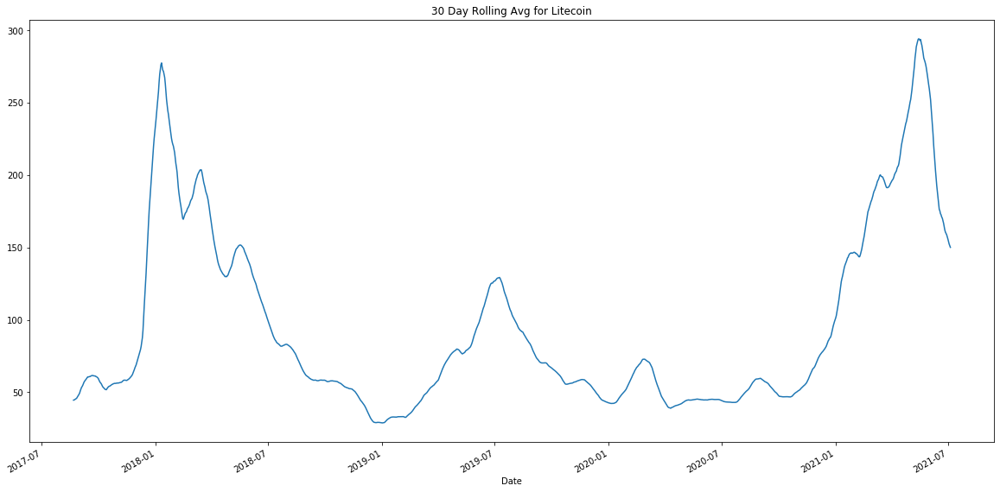

In [29]:
# 30 Day Rolling Average Litecoin
ltc_sma = crypto_data['LTC-USD'].rolling(window=30).mean()
ltc_sma.plot(figsize=(20,10),title='30 Day Rolling Avg for Litecoin')

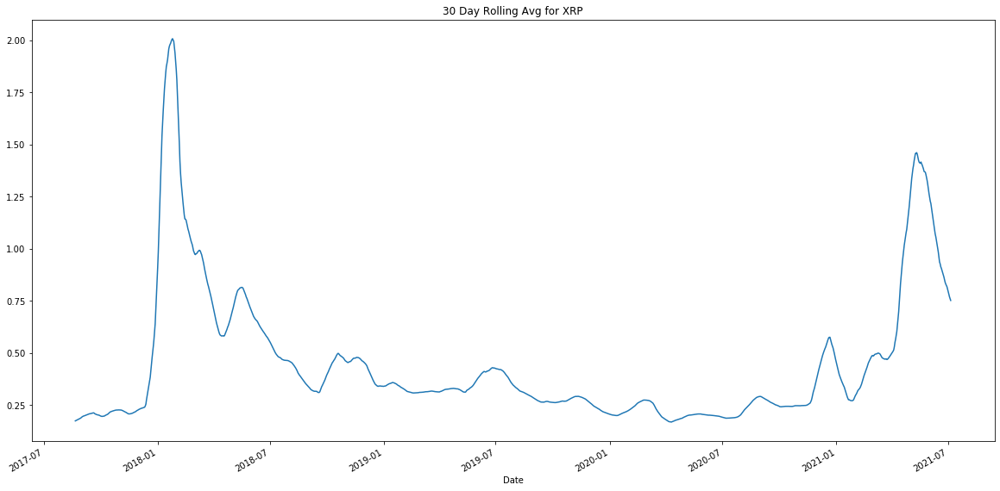

In [30]:
# 30 Day Rolling Average Ripple
xrp_sma = crypto_data['XRP-USD'].rolling(window=30).mean()
xrp_sma.plot(figsize=(20,10),title='30 Day Rolling Avg for XRP')

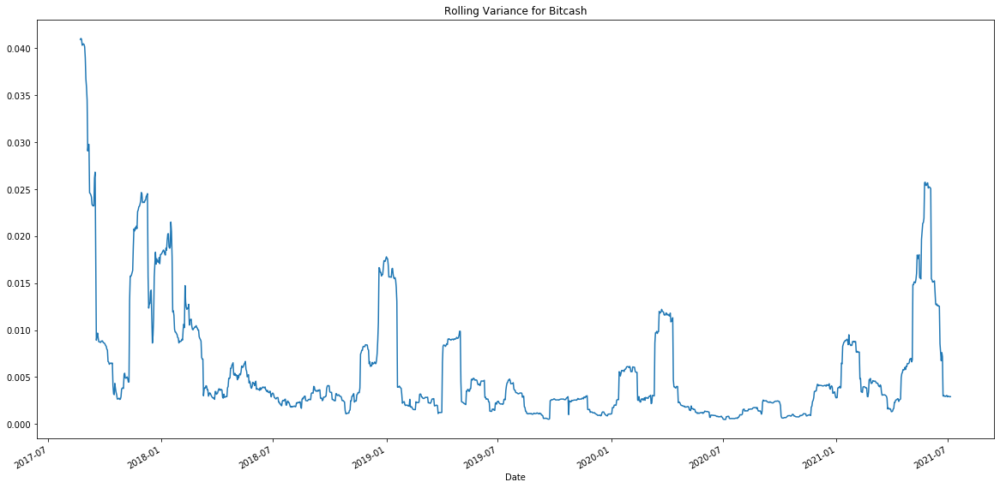

In [31]:
# Bitcash Variance
bch_variance= crypto_daily_returns['BCH-USD'].rolling(30).var()
bch_variance.plot(figsize=(20,10),title='Rolling Variance for Bitcash')

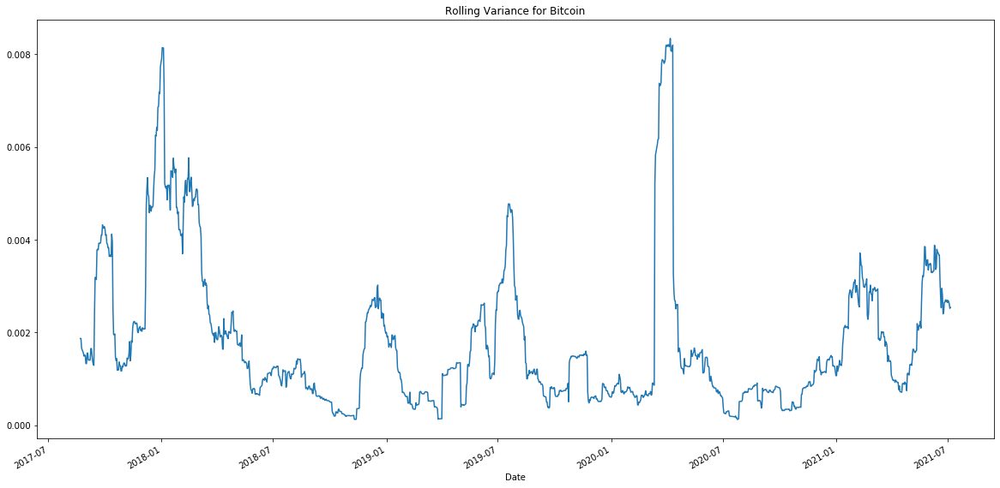

In [32]:
# Bitcoin Variance
btc_variance= crypto_daily_returns['BTC-USD'].rolling(30).var()
btc_variance.plot(figsize=(20,10),title='Rolling Variance for Bitcoin')

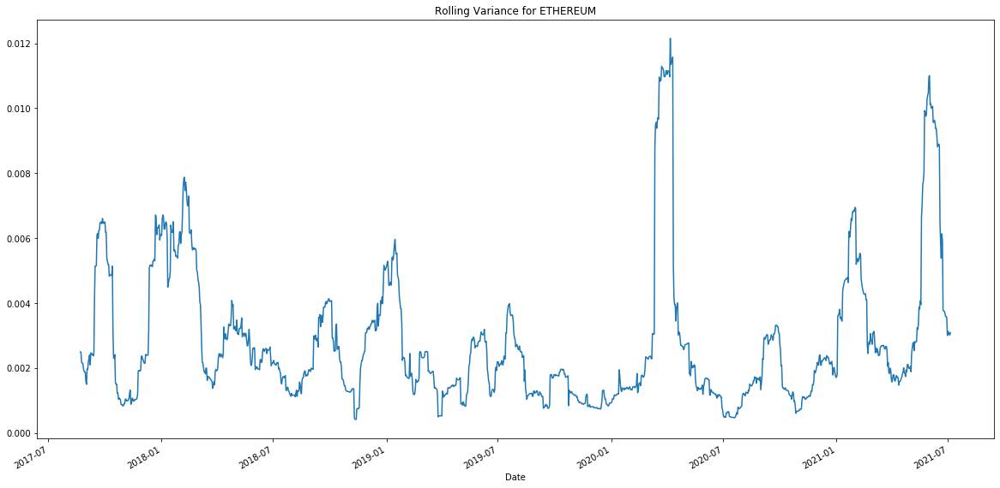

In [33]:
# Ethereum Variance
eth_variance= crypto_daily_returns['ETH-USD'].rolling(30).var()
eth_variance.plot(figsize=(20,10),title='Rolling Variance for ETHEREUM')

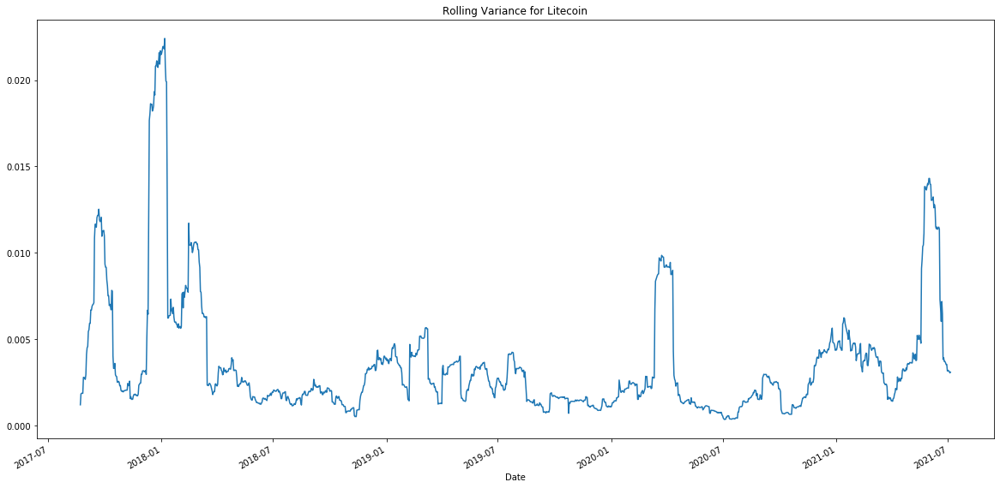

In [34]:
# Litecoin Variance
ltc_variance= crypto_daily_returns['LTC-USD'].rolling(30).var()
ltc_variance.plot(figsize=(20,10),title='Rolling Variance for Litecoin')

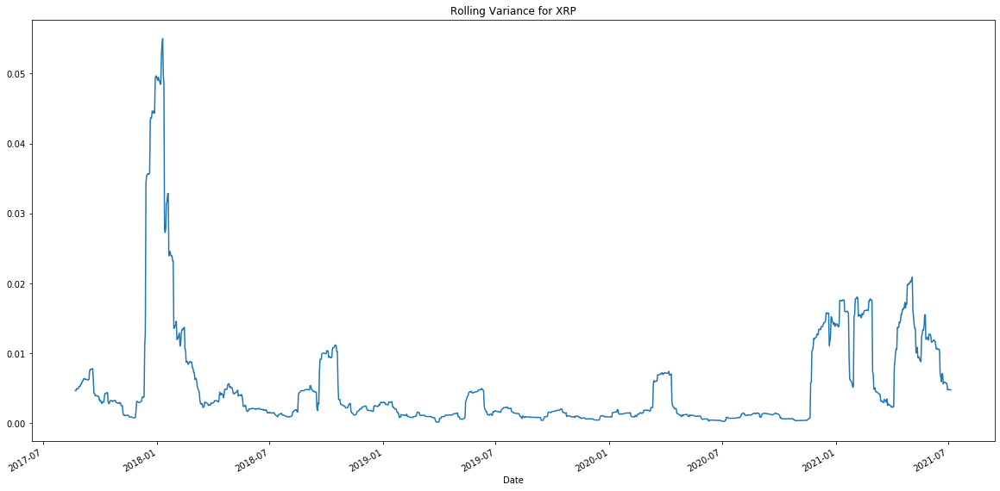

In [35]:
# Ripple Variance
xrp_variance= crypto_daily_returns['XRP-USD'].rolling(30).var()
xrp_variance.plot(figsize=(20,10),title='Rolling Variance for XRP')

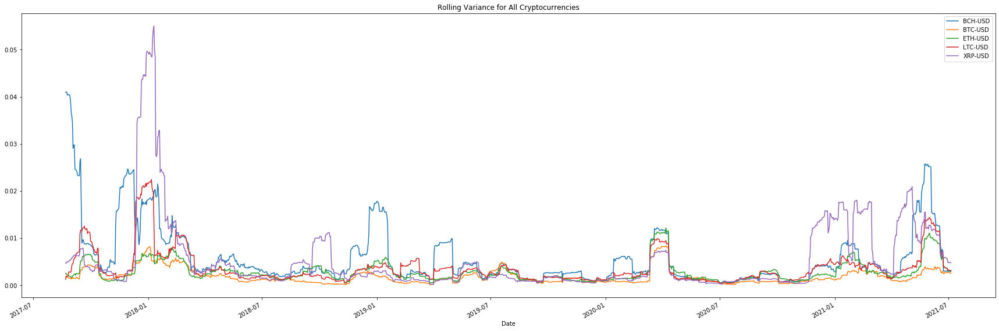

In [36]:
# Plot variance of all daily returns
crypto_var = crypto_daily_returns.rolling(30).var()
crypto_var.plot(figsize=(30,10), title = 'Rolling Variance for All Cryptocurrencies')

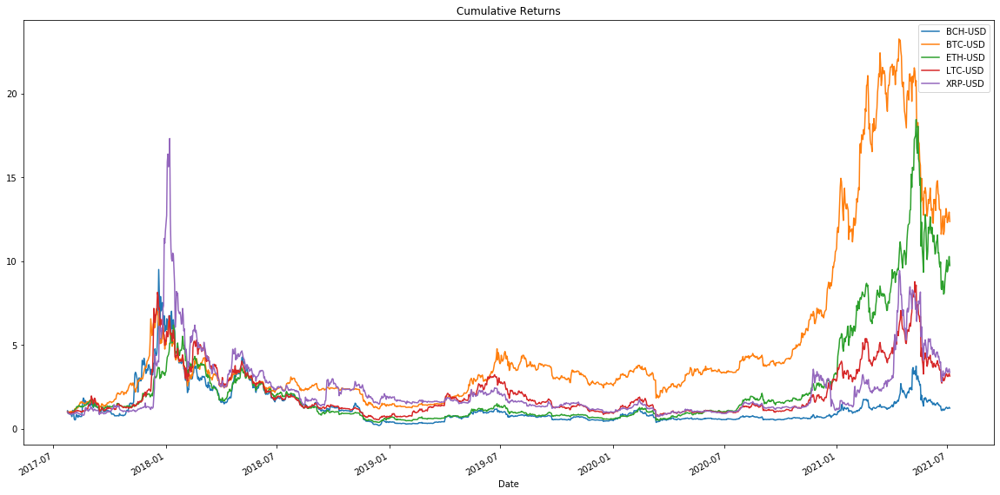

In [37]:
# Calculate cumulative returns of aall cryptocurrencies
cumulative_returns = (1 + crypto_daily_returns).cumprod()
cumulative_returns.plot(figsize=(20, 10), title="Cumulative Returns")

In [38]:
cumulative_returns.head()

,BCH-USD,BTC-USD,ETH-USD,LTC-USD,XRP-USD
Date,,,,,
2017-07-23,NaN,NaN,NaN,NaN,NaN
2017-07-24,1.066918,1.008958,0.994512,1.007935,0.984333
2017-07-25,0.985080,0.943627,0.914844,0.958811,0.913082
2017-07-26,0.885624,0.926403,0.902643,0.958548,0.891130
2017-07-27,0.933228,0.978531,0.904258,0.956508,0.889259


In [39]:
# Correlation of Daily Return for different Cryptocurrencies
corr_df = crypto_daily_returns.corr()
corr_df.style.background_gradient(cmap="bwr")

,BCH-USD,BTC-USD,ETH-USD,LTC-USD,XRP-USD
BCH-USD,1.000000,0.554351,0.641889,0.613810,0.463349
BTC-USD,0.554351,1.000000,0.735875,0.712761,0.463306
ETH-USD,0.641889,0.735875,1.000000,0.796700,0.583863
LTC-USD,0.613810,0.712761,0.796700,1.000000,0.550668
XRP-USD,0.463349,0.463306,0.583863,0.550668,1.000000


In [40]:
# Annualized Sharpe Ratios
sharpe_ratios = (crypto_daily_returns.mean() * 252) / (crypto_daily_returns.std() * np.sqrt(252))
sharpe_ratios

BCH-USD    0.618265
BTC-USD    0.993187
ETH-USD    0.902668
LTC-USD    0.680122
XRP-USD    0.714743
dtype: float64

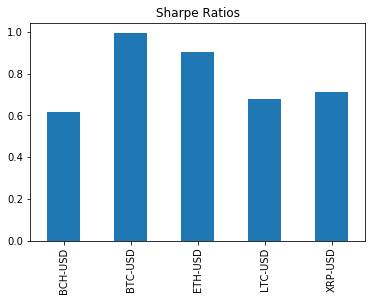

In [41]:
# Visualize the sharpe ratios as a bar plot
sharpe_ratios.plot(kind="bar", title="Sharpe Ratios")

Column(height=750, sizing_mode='fixed', width=1024)
    [0] Row
        [0] StaticText(align='center', value='<h3>Cryptocurrency f...)
    [1] Tabs
        [0] Column
            [0] Markdown(None, width=1024)
            [1] Row
                [0] Plotly(Figure)
        [1] Column
            [0] Markdown(None, width=1024)
            [1] Row
                [0] Str(None)
            [2] Row
                [0] Str(None)
            [3] Row
                [0] Str(None)
            [4] Row
                [0] Str(None)
            [5] Row
                [0] Str(None)
        [2] Column
            [0] Markdown(None, width=1024)
            [1] Row
                [0] Plotly(Figure)
            [2] Row
                [0] Plotly(Figure)
            [3] Row
                [0] Plotly(Figure)
            [4] Row
                [0] Plotly(Figure)
            [5] Row
                [0] Plotly(Figure)
        [3] Column
            [0] Markdown(None, width=1024)
            [1] Row
                [0] Plotly(Figure)
            [2] Row
                [0] Plotly(Figure)
            [3] Row
                [0] Plotly(Figure)
            [4] Row
                [0] Plotly(Figure)
            [5] Row
                [0] Plotly(Figure)
        [4] Column
            [0] Markdown(None, width=1024)
            [1] Row
                [0] Plotly(Figure)
            [2] Row
                [0] Plotly(Figure)
            [3] Row
                [0] Plotly(Figure)
            [4] Row
                [0] Plotly(Figure)
            [5] Row
                [0] Plotly(Figure)
        [5] Column
            [0] Markdown(None, width=1024)
            [1] Row
                [0] Plotly(Figure)
            [2] Row
                [0] Plotly(Figure)
            [3] Row
                [0] Plotly(Figure)
            [4] Row
                [0] Plotly(Figure)
            [5] Row
                [0] Plotly(Figure)

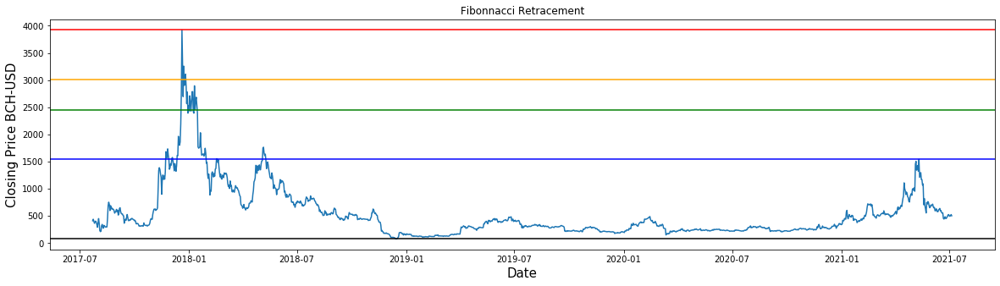

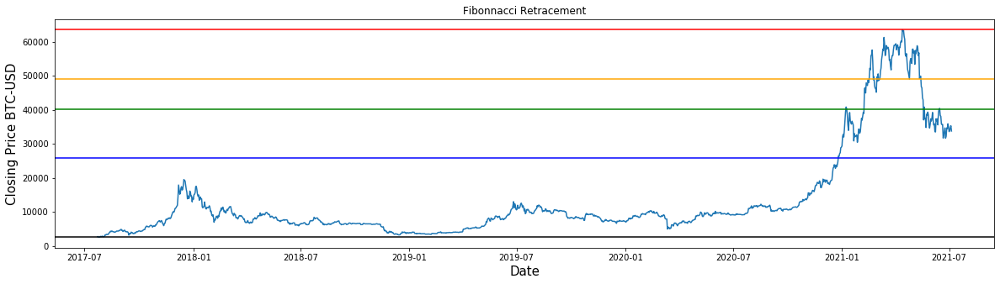

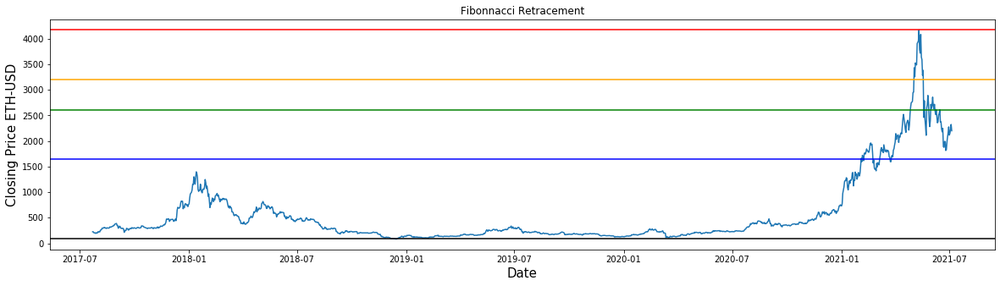

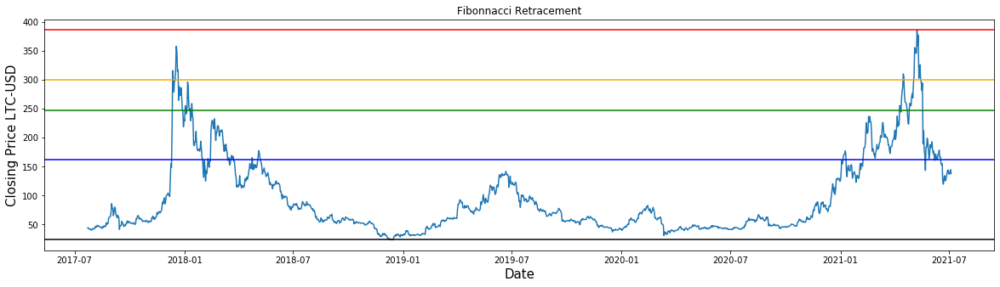

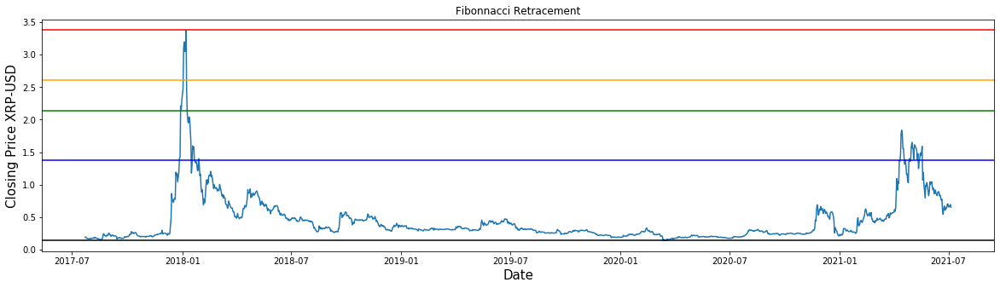

In [42]:
heading = "<h3>Cryptocurrency forecasting</h3>"
title = pnw.StaticText(value=heading, align="center")
welcome = pn.pane.Markdown(
# this dashboard present a visual analysis of cryptocurrency forecasting
    width=1024
)
second_title = pn.pane.Markdown(
    width=1024
)
#create tab layout for dashboard
tabs = pn.Tabs(
    #first tab
    (
        "Crypto Daily Returns",
        pn.Column(
        welcome,
            pn.Row(
                px.line(crypto_daily_returns)
            )
        )
    ),
       (
        "Fibonacci",
        pn.Column(
        second_title,
                pn.Row(plot_fib_ret(crypto_data,'BCH-USD')),
                pn.Row(plot_fib_ret(crypto_data,'BTC-USD')),
                pn.Row(plot_fib_ret(crypto_data,'ETH-USD')),
                pn.Row(plot_fib_ret(crypto_data,'LTC-USD')),
                pn.Row(plot_fib_ret(crypto_data,'XRP-USD'))
            )
        ),
        (
            "EMA",
        pn.Column(
        second_title,
                pn.Row(px.line(bch_EMA, title='BITCASH')),
                pn.Row(px.line(btc_EMA, title='BITCOIN')),
                pn.Row(px.line(eth_EMA, title='ETHEREUM')),
                pn.Row(px.line(ltc_EMA, title='LITECOIN')),
                pn.Row(px.line(xrp_EMA, title='XRP'))
            )
        ),
      (
            "STD",
        pn.Column(
        second_title,
                pn.Row(px.line(bch_std, title='BITCASH')),
                pn.Row(px.line(btc_std, title='BITCOIN')),
                pn.Row(px.line(eth_std, title='ETHEREUM')),
                pn.Row(px.line(ltc_std, title='LITECOIN')),
                pn.Row(px.line(xrp_std, title='XRP'))
            )
        ),
     (
            "SMA",
        pn.Column(
        second_title,
                pn.Row(px.line(bch_sma, title='BITCASH')),
                pn.Row(px.line(btc_sma, title='BITCOIN')),
                pn.Row(px.line(eth_sma, title='ETHEREUM')),
                pn.Row(px.line(ltc_sma, title='LITECOIN')),
                pn.Row(px.line(xrp_sma, title='XRP'))
            )
        ),
    (
            "VAR",
        pn.Column(
        second_title,
                pn.Row(px.line(bch_variance)),
                pn.Row(px.line(btc_variance)),
                pn.Row(px.line(eth_variance)),
                pn.Row(px.line(ltc_variance)),
                pn.Row(px.line(xrp_variance))
            )
        )
    )
#create main dashboard
dashboard = pn.Column(
    pn.Row(title),
    tabs,
    width=1024,
    height=750
)

dashboard.servable()

In [43]:
# SINCE THE PANEL CANNOT TAKE A LOAD OF MORE GRAPHS THEREFORE WE HAVE CREA

In [44]:
import panel.widgets as pnw
import panel as pn
import plotly.express as px
pn.extension("plotly")
heading = "<h3>Cryptocurrency forecasting</h3>"
title = pnw.StaticText(value=heading, align="center")
welcome = pn.pane.Markdown(
# this dashboard present a visual analysis of cryptocurrency forecasting
    width=1024
)
second_title = pn.pane.Markdown(
    width=1024
)
#create tab layout for dashboard
tabs = pn.Tabs(
    #first tab
    (
        "Crypto Daily Returns",
        pn.Column(
        welcome,
            pn.Row(
                px.line(crypto_daily_returns)
            )
        )
    ),(
            "VAR",
        pn.Column(
        second_title,
                pn.Row(px.line(bch_variance)),
                pn.Row(px.line(btc_variance)),
                pn.Row(px.line(eth_variance)),
                pn.Row(px.line(ltc_variance)),
                pn.Row(px.line(xrp_variance))
            )
        )
    )
#create main dashboard
dashboard = pn.Column(
    pn.Row(title),
    tabs,
    width=1024,
    height=750
)

dashboard.servable()

Column(height=750, sizing_mode='fixed', width=1024)
    [0] Row
        [0] StaticText(align='center', value='<h3>Cryptocurrency f...)
    [1] Tabs
        [0] Column
            [0] Markdown(None, width=1024)
            [1] Row
                [0] Plotly(Figure)
        [1] Column
            [0] Markdown(None, width=1024)
            [1] Row
                [0] Plotly(Figure)
            [2] Row
                [0] Plotly(Figure)
            [3] Row
                [0] Plotly(Figure)
            [4] Row
                [0] Plotly(Figure)
            [5] Row
                [0] Plotly(Figure)

In [45]:
import panel.widgets as pnw
heading = "<h3>Cryptocurrency forecasting</h3>"
title = pnw.StaticText(value=heading, align="center")
welcome = pn.pane.Markdown(
# this dashboard present a visual analysis of cryptocurrency forecasting
    width=1024
)
second_title = pn.pane.Markdown(
    width=1024
)
#create tab layout for dashboard
tabs = pn.Tabs(
    (
            "EMA",
        pn.Column(
        second_title,
                pn.Row(px.line(bch_EMA, title='BITCASH')),
                pn.Row(px.line(btc_EMA, title='BITCOIN')),
                pn.Row(px.line(eth_EMA, title='ETHEREUM')),
                pn.Row(px.line(ltc_EMA, title='LITECOIN')),
                pn.Row(px.line(xrp_EMA, title='XRP'))
            )
        )
    )
#create main dashboard
dashboard = pn.Column(
    pn.Row(title),
    tabs,
    width=1024,
    height=750
)

dashboard.servable()

Column(height=750, sizing_mode='fixed', width=1024)
    [0] Row
        [0] StaticText(align='center', value='<h3>Cryptocurrency f...)
    [1] Tabs
        [0] Column
            [0] Markdown(None, width=1024)
            [1] Row
                [0] Plotly(Figure)
            [2] Row
                [0] Plotly(Figure)
            [3] Row
                [0] Plotly(Figure)
            [4] Row
                [0] Plotly(Figure)
            [5] Row
                [0] Plotly(Figure)

In [46]:
import panel.widgets as pnw
heading = "<h3>Cryptocurrency forecasting</h3>"
title = pnw.StaticText(value=heading, align="center")
welcome = pn.pane.Markdown(
# this dashboard present a visual analysis of cryptocurrency forecasting
    width=1024
)
second_title = pn.pane.Markdown(
    width=1024
)
#create tab layout for dashboard
tabs = pn.Tabs(
    (
            "STD",
        pn.Column(
        second_title,
                pn.Row(px.line(bch_std, title='BITCASH')),
                pn.Row(px.line(btc_std, title='BITCOIN')),
                pn.Row(px.line(eth_std, title='ETHEREUM')),
                pn.Row(px.line(ltc_std, title='LITECOIN')),
                pn.Row(px.line(xrp_std, title='XRP'))
            )
        ),
    )
#create main dashboard
dashboard = pn.Column(
    pn.Row(title),
    tabs,
    width=1024,
    height=750
)

dashboard.servable()

Column(height=750, sizing_mode='fixed', width=1024)
    [0] Row
        [0] StaticText(align='center', value='<h3>Cryptocurrency f...)
    [1] Tabs
        [0] Column
            [0] Markdown(None, width=1024)
            [1] Row
                [0] Plotly(Figure)
            [2] Row
                [0] Plotly(Figure)
            [3] Row
                [0] Plotly(Figure)
            [4] Row
                [0] Plotly(Figure)
            [5] Row
                [0] Plotly(Figure)

In [47]:
import panel.widgets as pnw
heading = "<h3>Cryptocurrency forecasting</h3>"
title = pnw.StaticText(value=heading, align="center")
welcome = pn.pane.Markdown(
# this dashboard present a visual analysis of cryptocurrency forecasting
    width=1024
)
second_title = pn.pane.Markdown(
    width=1024
)
#create tab layout for dashboard
tabs = pn.Tabs(
    (
            "SMA",
        pn.Column(
        second_title,
                pn.Row(px.line(bch_sma, title='BITCASH')),
                pn.Row(px.line(btc_sma, title='BITCOIN')),
                pn.Row(px.line(eth_sma, title='ETHEREUM')),
                pn.Row(px.line(ltc_sma, title='LITECOIN')),
                pn.Row(px.line(xrp_sma, title='XRP'))
            )
        ),
    )
#create main dashboard
dashboard = pn.Column(
    pn.Row(title),
    tabs,
    width=1024,
    height=750
)

dashboard.servable()

Column(height=750, sizing_mode='fixed', width=1024)
    [0] Row
        [0] StaticText(align='center', value='<h3>Cryptocurrency f...)
    [1] Tabs
        [0] Column
            [0] Markdown(None, width=1024)
            [1] Row
                [0] Plotly(Figure)
            [2] Row
                [0] Plotly(Figure)
            [3] Row
                [0] Plotly(Figure)
            [4] Row
                [0] Plotly(Figure)
            [5] Row
                [0] Plotly(Figure)

Column(height=750, sizing_mode='fixed', width=1024)
    [0] Row
        [0] StaticText(align='center', value='<h3>Cryptocurrency f...)
    [1] Tabs
        [0] Column
            [0] Markdown(None, width=1024)
            [1] Row
                [0] Str(None)
            [2] Row
                [0] Str(None)
            [3] Row
                [0] Str(None)
            [4] Row
                [0] Str(None)
            [5] Row
                [0] Str(None)

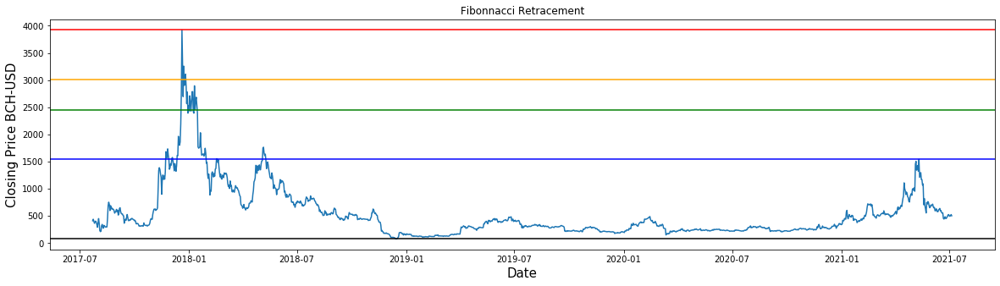

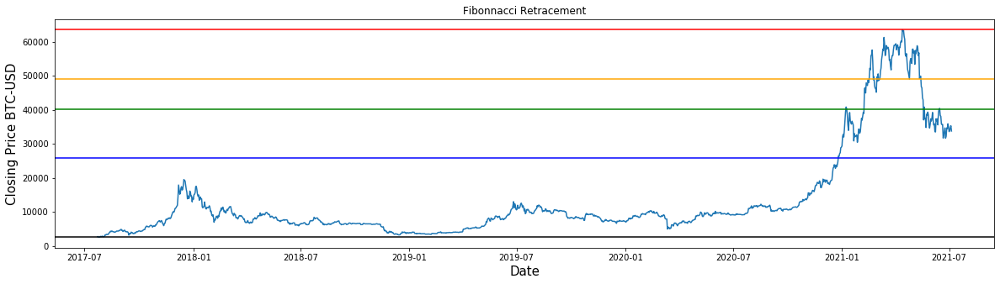

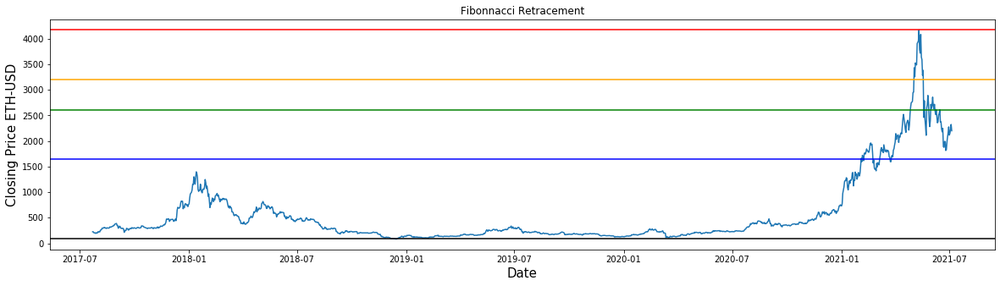

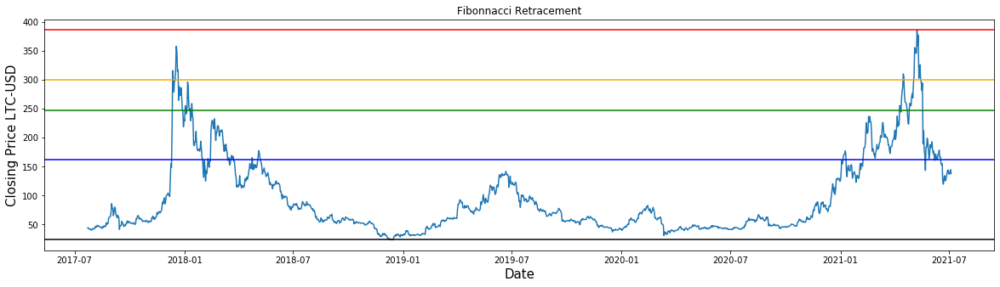

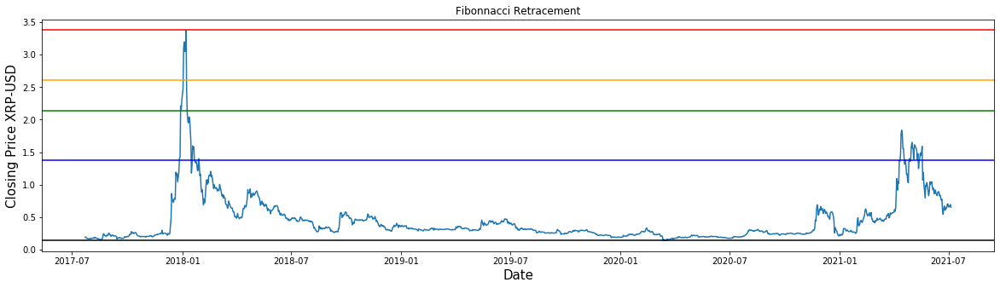

In [48]:
import panel.widgets as pnw
heading = "<h3>Cryptocurrency forecasting</h3>"
title = pnw.StaticText(value=heading, align="center")
welcome = pn.pane.Markdown(
# this dashboard present a visual analysis of cryptocurrency forecasting
    width=1024
)
second_title = pn.pane.Markdown(
    width=1024
)
#create tab layout for dashboard
tabs = pn.Tabs(
    (
        "Fibonacci",
        pn.Column(
        second_title,
                pn.Row(plot_fib_ret(crypto_data,'BCH-USD')),
                pn.Row(plot_fib_ret(crypto_data,'BTC-USD')),
                pn.Row(plot_fib_ret(crypto_data,'ETH-USD')),
                pn.Row(plot_fib_ret(crypto_data,'LTC-USD')),
                pn.Row(plot_fib_ret(crypto_data,'XRP-USD'))
            )
        ),
    )
#create main dashboard
dashboard = pn.Column(
    pn.Row(title),
    tabs,
    width=1024,
    height=750
)

dashboard.servable()